In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATASETS
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE CELL.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote
from urllib.error import HTTPError
from zipfile import ZipFile

CHUNK_SIZE = 40960 
DATASET_MAPPING = 'jane-street-market-prediction:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F23304%2F1691737%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20201203%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20201203T045713Z%26X-Goog-Expires%3D259199%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D0358655cd72542f0a7d6fff29bf8bf6ab9b79d9a95efe6c923001ff497c2478628c3d6e3ff450e79d6b6d08f8aa9d3d86ab6ac5359221186a3486ff230f442b56d4e3774dd555445dfcd8d7ba90848ddfd562107f659e31555ec9560a21508b2c280b550b6bd0076de83e11dad2e67e99356f0d7bdf4e1dbae2ff6520fb59883406e23a3cebfac163fb69ce07963b6faa3f1f9d1f4288e34c7505fe04137fc1026ca965ebbb27922a9c6172808e698196b6242d7b9cca51854c06983d9628be3fbd3407df2c6b9b486cb4a5bbc4a6c2b658fcc569d9ddb29284188c2f751eb41ed5122a2b8211db7e9bde9c39afcb5155bbfe426ab18dc05c1fdf77c8f0cd115'
KAGGLE_INPUT_PATH='/home/kaggle/input'
KAGGLE_INPUT_SYMLINK='/kaggle'

os.makedirs(KAGGLE_INPUT_PATH, 777)
os.symlink(KAGGLE_INPUT_PATH, os.path.join('..', 'input'), target_is_directory=True)
os.makedirs(KAGGLE_INPUT_SYMLINK)
os.symlink(KAGGLE_INPUT_PATH, os.path.join(KAGGLE_INPUT_SYMLINK, 'input'), target_is_directory=True)

for dataset_mapping in DATASET_MAPPING.split(','):
    directory, download_url_encoded = dataset_mapping.split(':')
    download_url = unquote(download_url_encoded)
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as zipfileres, NamedTemporaryFile() as tfile:
            total_length = zipfileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes zipped')
            dl = 0
            data = zipfileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = zipfileres.read(CHUNK_SIZE)
            print(f'\nUnzipping {directory}')
            with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue
print('Dataset import complete.')


<h1><center>Jane Street Market Prediction</center></h1>
<h2><center>Advanced EDA - from perspectives of features-based clustering to features comparison between clusters</center></h2>

<h3><center>2020-11-29</center></h3>

<h4><center>We have a fun interesting lung-shape UMAP visualization! And it looks like coronavirus infections at left and right lungs ;)</center></h4>

<div class="list-group" id="list-tab" role="tablist">
<h2 class="list-group-item list-group-item-action active" data-toggle="list" style='background:green; border:0; color:white' role="tab" aria-controls="home"><center>Quick navigation</center></h2>

* [1. Package installations + import libraries + data loading](#1)
* [2. Principle Component Analysis (features basis, disregard time-series)](#2)
* [3. Leiden clustering on tsne/umap dimensional reductions ](#3)
* [4. Differential expressing features defining each cluster](#4)
    
##### Although you can navigate to the topic of interest, it is recommended to first read from top-down before navigating around.

<a id="1"></a>
<h2 style='background:green; border:0; color:white'><center>1. Package installations + import libraries + data loading</center><h2>

### Packages
If you wish to replicate this work, you'll need to excecute the following cell to install the quanp package (https://quanp.readthedocs.io/en/latest/installation.html) that should install all necessary packages/libraries required to execute the codes in this tutorial. 

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import quanp as qp
import gc

from IPython.display import display
from matplotlib import rcParams

# setting visualization/logging parameters
pd.set_option('display.max_columns', None)
qp.set_figure_params(dpi=100, color_map = 'viridis_r')
qp.settings.verbosity = 1
qp.logging.print_versions()

In [24]:
import datatable as dt
train_data_datatable = dt.fread('../input/jane-street-market-prediction/train.csv')

# Loading pandas dataframe as anndata 
#train = pd.read_csv('/kaggle/input/jane-street-market-prediction/train.csv')
train = train_data_datatable.to_pandas()

# We disregard the timeseries perspective and drop all the rows with nan value in any columns. 
train = train.dropna()

In [25]:
# resampling the subjects at fraction of 0.1 - due to current notebook runtime memory restriction
train = train.sample(frac=0.05, random_state=0)

### Features description
I only briefly checking the usual min, max, mean, median, 25th, 75th percentage for rough estimation of the distribution patterns of the 130 features. This is useful for me to see if i need to do normalization or scaling later. 

For detailed visualization for each feature, i recommend to visit https://www.kaggle.com/blurredmachine/jane-street-market-eda-viz-prediction produced by blurredmachine.;)

In [26]:
# Get lists of features
train_features = [s for s in train.columns if "feature_" in s]
train[train_features].describe()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,feature_100,feature_101,feature_102,feature_103,feature_104,feature_105,feature_106,feature_107,feature_108,feature_109,feature_110,feature_111,feature_112,feature_113,feature_114,feature_115,feature_116,feature_117,feature_118,feature_119,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129
count,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000,99669.000000
mean,0.011970,0.414531,0.358276,0.006513,0.001728,0.004113,-0.007330,0.049950,0.028081,0.259586,0.169602,0.094462,0.052609,0.142167,0.072821,0.217948,0.133440,0.121152,0.114927,0.287761,0.255987,0.190877,0.172779,0.247664,0.225506,0.286777,0.258151,0.130715,0.156683,0.309048,0.319620,0.216720,0.240036,0.300036,0.318621,0.328453,0.342394,0.032146,0.024503,0.041250,0.050718,0.402233,0.425867,0.398798,0.365113,0.412154,0.545976,0.441554,0.589702,0.647475,0.591397,0.502438,0.000803,0.295378,0.174480,0.690948,0.688203,0.553848,0.466581,0.572962,0.750765,0.731133,0.741060,0.751669,0.854147,0.862502,0.801935,0.913175,0.904721,0.403004,0.218858,0.337679,0.000957,-0.037674,-0.003817,-0.021601,-0.031790,-0.112423,-0.010342,-0.037304,-0.005991,-0.018604,-0.034689,-0.119764,0.338209,0.573864,0.311037,0.365284,0.503755,0.646866,0.357455,0.532502,0.287261

In [27]:
def plot_outlier_graph_set(df):    

    for f in df.columns:
        fig, axs = plt.subplots(1, 4, figsize=(16, 5))

        # plot 1
        sns.boxplot(y=f, data=df, ax=axs[0])

        # plot 2
        sns.boxenplot(y=f, data=df, ax=axs[1])

        # plot 3
        sns.violinplot(y=f, data=df, ax=axs[2]) 

        # plot 4
        sns.stripplot(y=f, data=df, size=4, color=".3", linewidth=0, ax=axs[3])


        fig.suptitle(f, fontsize=15, y=1.1)
        axs[0].set_title('Box Plot')
        axs[1].set_title('Boxen Plot')
        axs[2].set_title('Violin Plot')
        axs[3].set_title('Strip Plot')

        plt.tight_layout()
        plt.show()

## Checking extreme outliers values in the Y values
The y's included weights, resp, resp_1, resp_2, resp_3, resp_4. This is going to be useful to set the min and max values for plot visualization later.

## Checking extreme outliers values in the Y values
The y's included weights, resp, resp_1, resp_2, resp_3, resp_4. This is going to be useful to set the min and max values for plot visualization later.

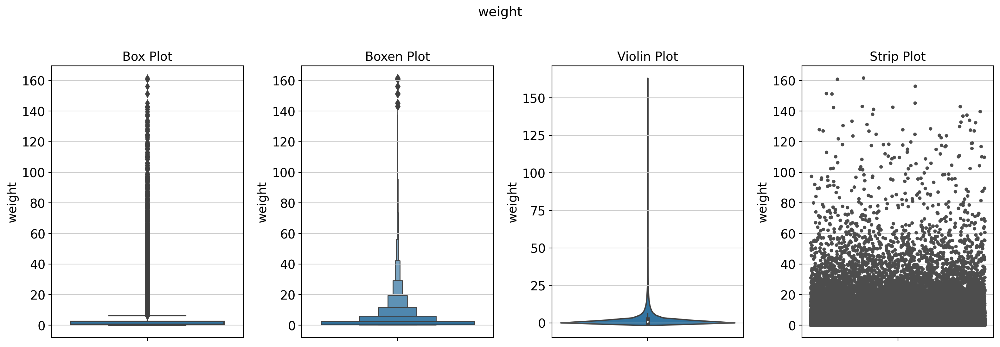

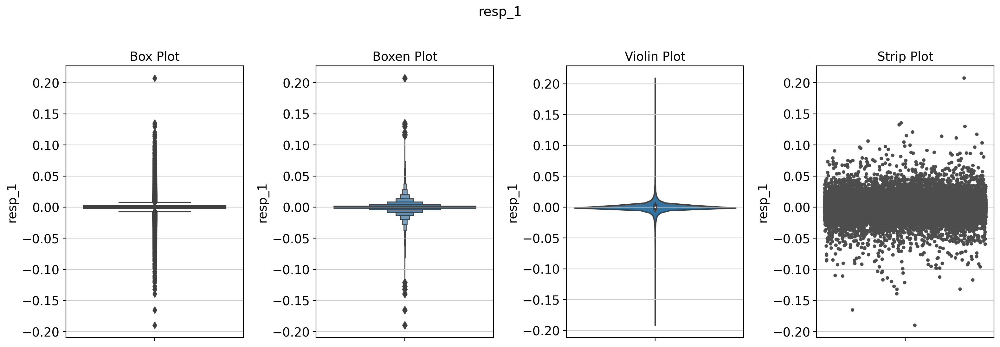

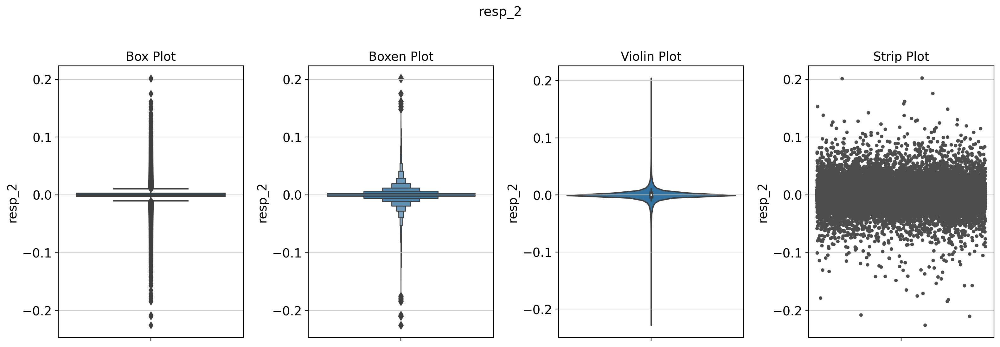

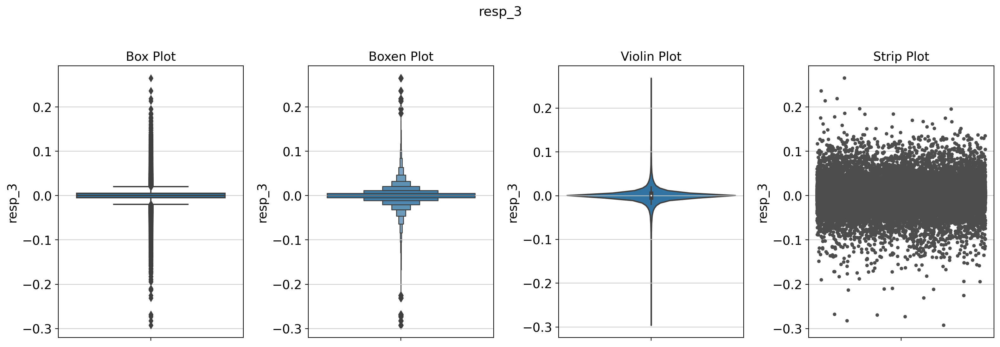

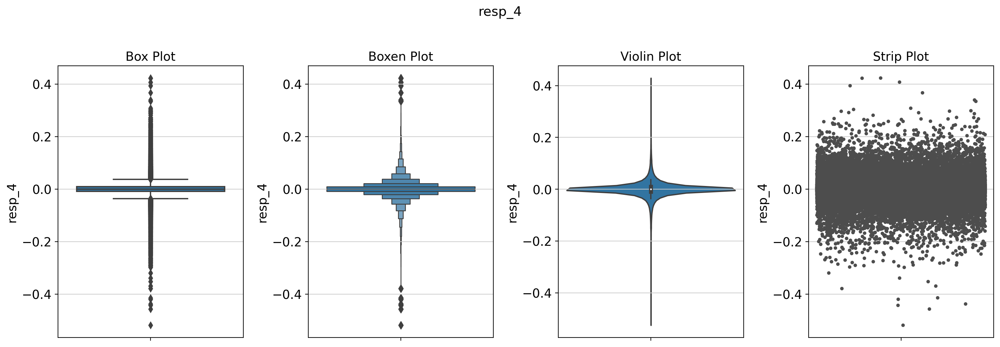

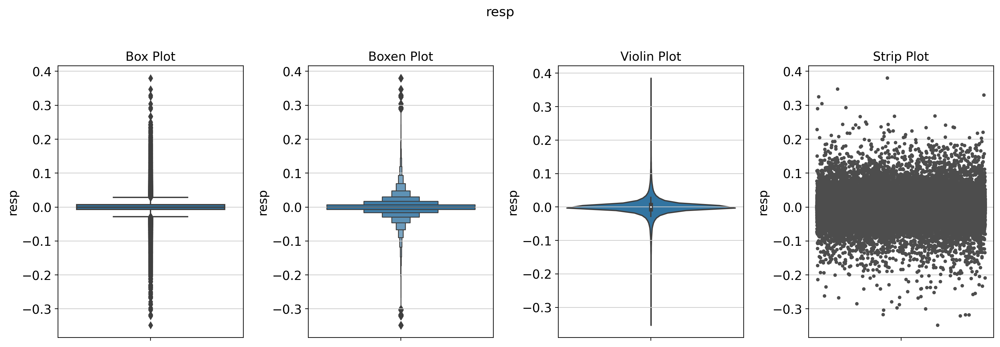

In [28]:
y_cols = [c for c in train.columns if 'resp' in c or 'weight' in c]
plot_outlier_graph_set(train[y_cols])  


In [29]:
# Loading pandas dataframe as anndata 
adata = qp.AnnData(train[train_features])

# add a new `.obs` column for additional categorical features
adata.obs['weight'] = train['weight'].values
adata.obs['resp_1'] = train['resp_1'].values
adata.obs['resp_2'] = train['resp_2'].values
adata.obs['resp_3'] = train['resp_3'].values
adata.obs['resp_4'] = train['resp_4'].values
adata.obs['resp'] = train['resp'].values

# housekeeping
train = 0
gc.collect()

/opt/conda/lib/python3.7/site-packages/anndata/utils.py:141: UserWarning: X converted to numpy array with dtype float64
  warnings.warn(f"{name} converted to numpy array with dtype {arr.dtype}")
/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


61258

<a id="2"></a>
<h2 style='background:green; border:0; color:white'><center>2. Principle Component Analysis (features basis, disregard time-series)</center><h2>

#### To reduce the dimensionality of the data by running PCA, which reveals the main axes of variation and denoises the data.
    
#### Note: I didn't do any data transformation or scaling for the feature data. Usually, it works the best to subject the features to minmax normalization, log2(x+1) Transformation and Standardardization Scaling before proceeding to PCA analysis. From what the features description above, it reads that the organizer may have done that for us. 

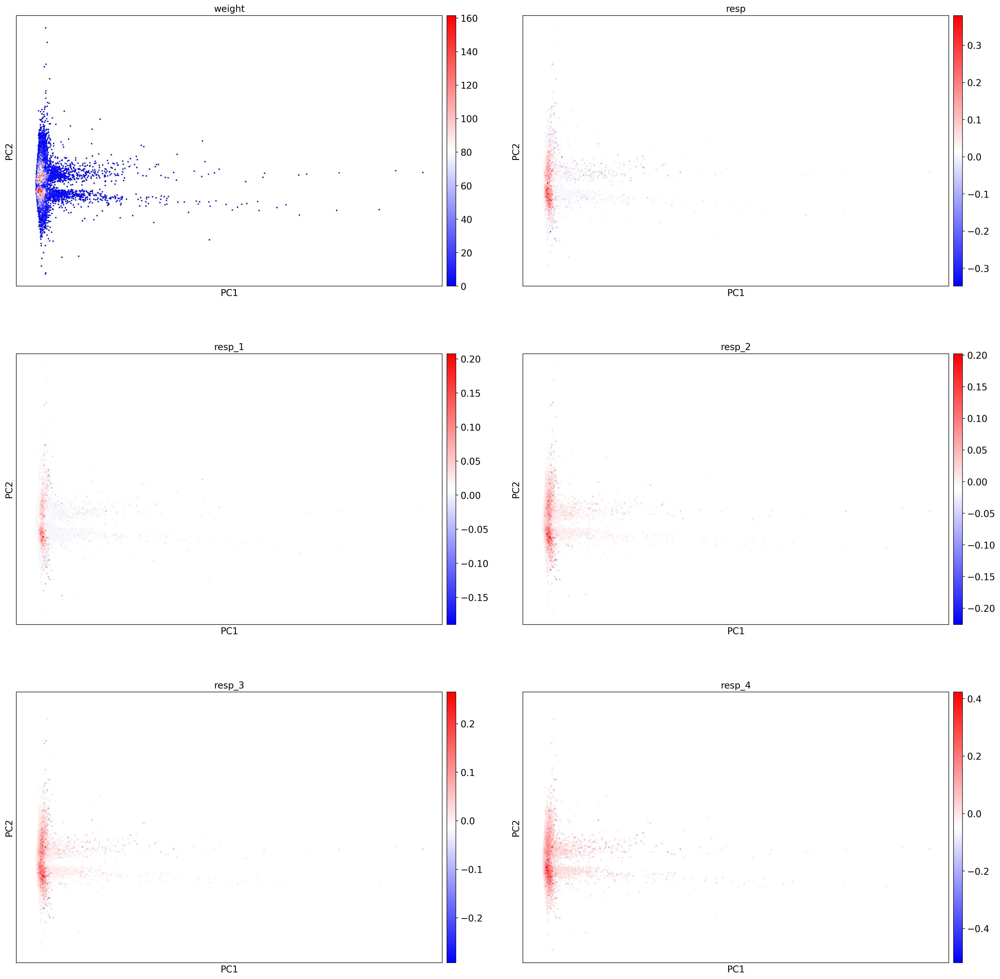

In [35]:
#print (adata)
rcParams['figure.figsize'] = 12, 8
qp.tl.pca(adata, svd_solver='arpack', random_state=0);
qp.pl.pca(adata, 
          color=['weight', 'resp', 'resp_1', 'resp_2', 'resp_3', 'resp_4'], 
          size=20, cmap='bwr', 
          ncols=2);

Here, it seems that the PC1 and 2 are somehow useful to separate high and low values in the Y that we are looking at.

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations or further dimension reductions of subjects, e.g. used in the clustering function qp.tl.leiden() or tSNE qp.tl.tsne(). In our experience, often, a rough estimate of the number of PCs does fine. The 'elbow' point seems to suggest at least up to PC5 will be useful to characterize the subjects. Here, we are going to do further dimensional reduction based on the first 5 PCs later. 

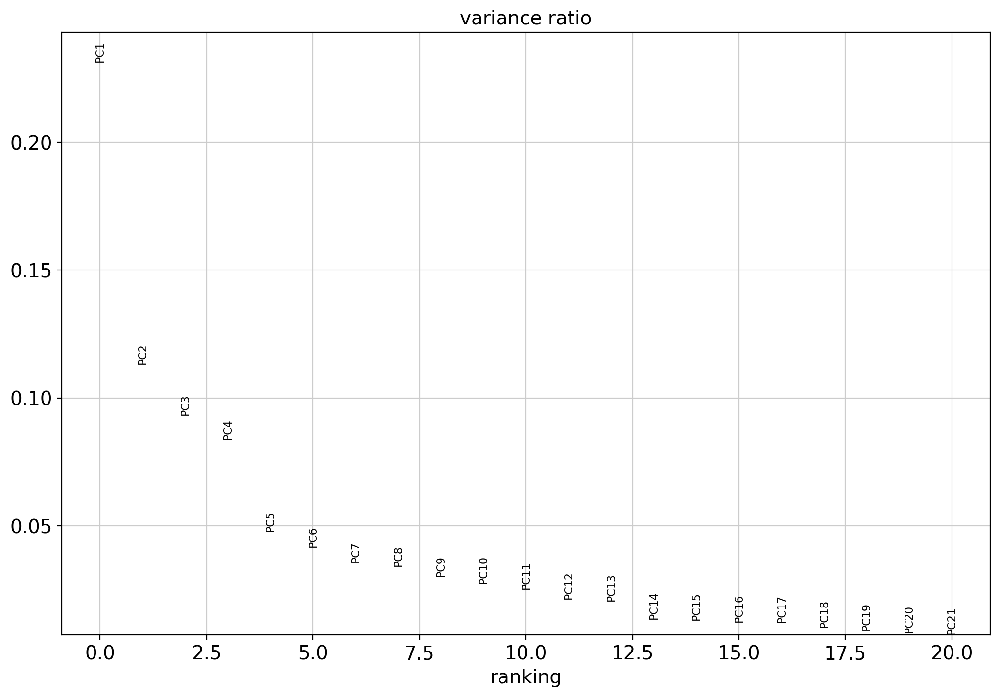

In [38]:
qp.pl.pca_variance_ratio(adata, n_pcs=20)

<a id="3"></a>
<h2 style='background:green; border:0; color:white'><center>3. Leiden clustering on tsne/umap dimensional reductions</center><h2>

#### We use Leiden graph-clustering method (community detection based on optimizing modularity) by Traag et al. (2018) to cluster the neighborhood graph of companies. We are going to first compute the neighborhood graph for this. We  compute the neighborhood graph of subjects using the PCA representation of the data matrix. This will give rise to distances and connectivities with other subjects for each subject. Here, we consider 30 nearest neighbors with 5 PCs derived from the PCA. Afterward, we wil compute the leiden clustering.

In [36]:
qp.pp.neighbors(adata, n_neighbors=30, n_pcs=5, random_state=0); # 30 nearest neighbors and only consider the first 4 pcs
qp.tl.leiden(adata, random_state=0);

### Computing the T-distributed Stochastic Neighbor Embedding (tSNE)
Let us further reduce the dimensionality of the signficant PCs identified above wholly in to 2 dimensions using the tSNE. Here, the 'leiden' clusters , 'weight', 'resp', 'resp_1', 'resp_2', 'resp_3', 'resp_4' were mapped onto the tSNE. There were 8 leiden clusters obtained. 

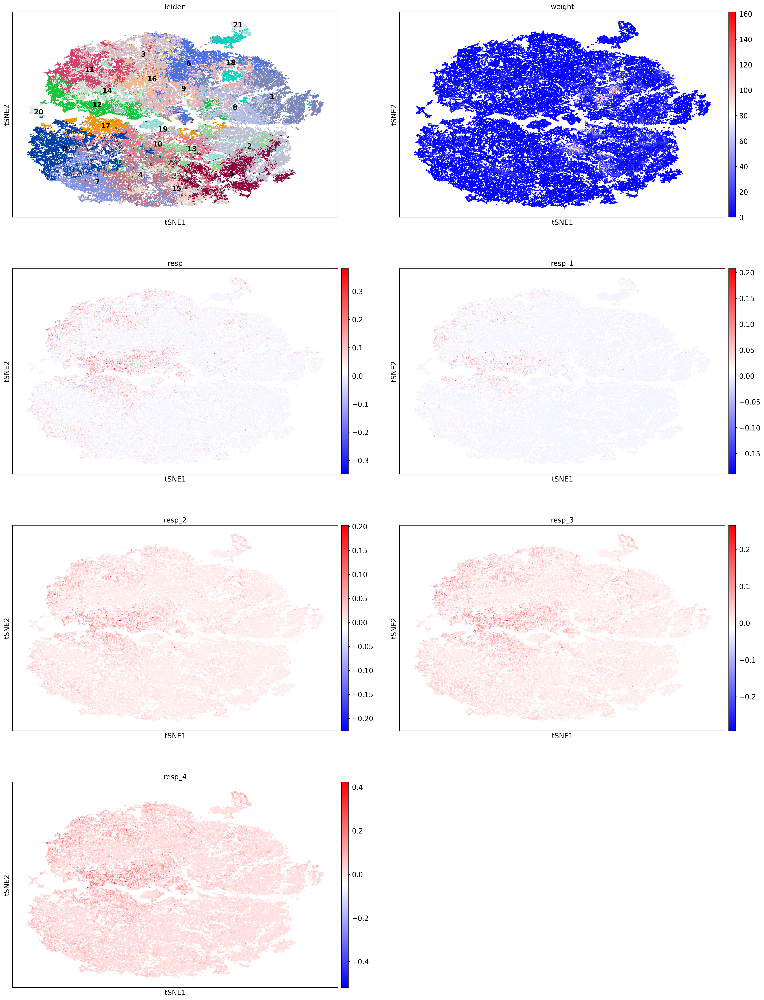

In [39]:
rcParams['figure.figsize'] = 12, 8
qp.tl.tsne(adata, n_pcs=10, random_state=0); # only consider the first 10 pcs

qp.pl.tsne(adata, color=['leiden', 'weight', 'resp', 'resp_1', 'resp_2', 'resp_3', 'resp_4'], 
           size=20, cmap='bwr',
           legend_loc='on data', ncols=2)

### Uniform Manifold Approximation and Projection (UMAP) - Embedding the neighborhood graph
We can also embed the neighborhood graph in 2 dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE. Before running the UMAP, we compute the correlations between clusters as initiating positions for the UMAP.

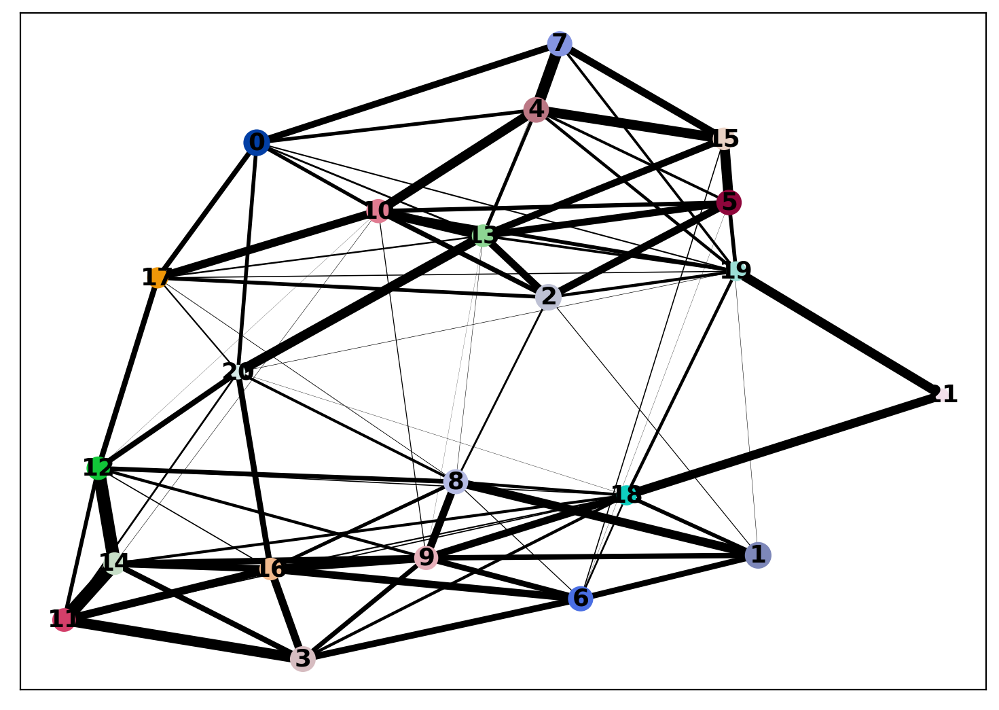

In [40]:
rcParams['figure.figsize'] = 8,6
qp.tl.paga(adata)
qp.pl.paga(adata, plot=True)

In [ ]:
rcParams['figure.figsize'] = 10, 6
qp.tl.umap(adata, init_pos='paga', random_state=0)
qp.pl.umap(adata, color=['leiden', 'weight'],            
           size=20, cmap='bwr', vmax = 75,
           legend_loc='on data', ncols=2)

Great! We have a lung shape UMAP plots here! Don't you think it looks like some kinds of coronavirus infection CT scan images, left and right lungs infected! haha

Anyway, here, we set the max value for the weight as 75 in the plot visualization, according to the extreme outliers detection plot above.
We can roughly see that most of the high weight subjects are clustered within or near the middle clusters of the 2 Big Clusters.


The plots on resp_1, 2, 3, 4 and resp below show that high resp values usually seems to mostly appear in certain parts of the one of the lungs. Interestingly, The connecting part of both lung lobes, can expressed both high and low resp values. Fun!

In [ ]:
qp.pl.umap(adata, color=['leiden', 'resp_1', 'resp_2', 'resp_3'],            
           size=20, cmap='bwr', vmax = 0.1, vmin= -0.1,
           legend_loc='on data', ncols=2)

In [ ]:
qp.pl.umap(adata, color=['resp_4', 'resp'],            
           size=20, cmap='bwr', vmax = 0.2, vmin= -0.2,
           legend_loc='on data', ncols=2)

<a id="7"></a>
<h2 style='background:green; border:0; color:white'><center>4. Differential expressing viability defining each cluster</center><h2>
    
### Visualizing the differential expressing features defining each cluster
We can identify features that are differentially expressed by each cluster or group. Here, we take each group of subjects and compare the distribution of each feature in a group against the distribution in all other subjects not in the group. Here, we list the top 30 features defining each cluster (P-value <0.05 as long as the score > +/-1.96).


In [ ]:
# Before we perform the group comparisons to get the differentiating features, we can check if euclidean distance itself 
# can gives us some hints that there are patterns of features appear between clades of clusters. 
qp.tl.dendrogram(adata, 'leiden', var_names=adata.var_names);
qp.pl.matrixplot(adata, adata.var_names, 'leiden',
                 standard_scale='var',
                 dendrogram=True, cmap='RdBu_r')

From the above, we can see the features 0, 17, 18, 19, 20, 21, 22, 23, ..., 31, 32, 33, 37, 38, 39, 40 potentially can split the subjects into 2 main clades. 

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning);

rcParams['figure.figsize'] = 6,8;
qp.tl.rank_features_groups(adata, 'leiden', method='wilcoxon');
qp.pl.rank_features_groups(adata, n_features=30, sharey=False);

We can visualize the top 5 features highly expressed by each cluster below.

In [ ]:
qp.pl.rank_features_groups_matrixplot(adata, n_features=5, 
                                      use_raw=False, 
                                      standard_scale='var',
                                      dendrogram=True, cmap='RdBu_r')

# References:

 1. https://www.kaggle.com/blurredmachine/jane-street-market-eda-viz-prediction
 2. Tabachnick & Fidell. Using Multivariate Statistics, Sixth Edition. PEARSON 2013; ISBN-13:9780205956227.
 2. Traag et al., From Louvain to Leiden: guaranteeing well-connected communities. Sci Rep. 2019;9(1):5233.
 3. McInnes & Healy, UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction, arXiv. 2018.
 4. https://quanp.readthedocs.io/en/latest/